In [34]:
import numpy as np
import pandas as pd
from keras.preprocessing.image import load_img


In [35]:
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from PIL import Image

img_width=224
img_height=224

img1=load_img(r"D:\my_data\AEROPLANE\plane.jpg")
img2=load_img(r"D:\my_data\CARS\BMW.jpg")
img3=load_img(r"D:\my_data\AEROPLANE\INDIGO.jpg")


In [36]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D
from keras.layers import Activation,Dropout,Flatten,Dense

In [37]:
img_width=224
img_height=224
train_data=r"D:\Machine Learning Project\DATA_SETS\v_data\train"
test_data=r"D:\Machine Learning Project\DATA_SETS\v_data\test"
train_samples=400
test_samples=100
input_shape=(img_width,img_height,3)


In [38]:
#model define
model=Sequential()
model.add(Conv2D(32,(2,2),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(32,(2,2),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(64,(2,2),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))


In [39]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 223, 223, 32)      416       
                                                                 
 activation_15 (Activation)  (None, 223, 223, 32)      0         
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 110, 110, 32)      4128      
                                                                 
 activation_16 (Activation)  (None, 110, 110, 32)      0         
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 55, 55, 32)        0         
 ng2D)                                                

In [40]:
model.compile(loss='binary_crossentropy',optimizer='rmsprop',metrics=['accuracy'])


In [41]:
train_data=ImageDataGenerator(rescale=1./255)
test_data=ImageDataGenerator(rescale=1./255)
train_data_load=train_data.flow_from_directory(
    r"D:\Machine Learning Project\DATA_SETS\v_data\train",
    target_size=(img_width,img_height),
    batch_size=20,
    class_mode='binary')
test_data_load=test_data.flow_from_directory(
    r"D:\Machine Learning Project\DATA_SETS\v_data\test",
    target_size=(img_width,img_height),
    batch_size=20,
    class_mode='binary')

Found 400 images belonging to 2 classes.
Found 103 images belonging to 2 classes.


In [46]:
model.fit_generator(
    train_data_load,
    epochs=5,
    validation_data=test_data_load,)

Epoch 1/5


C:\Users\saura\AppData\Local\Temp\ipykernel_5044\163047971.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(


20/20 [==============================] - 10s 490ms/step - loss: 0.0853 - accuracy: 0.9725 - val_loss: 0.3533 - val_accuracy: 0.9029
Epoch 2/5
20/20 [==============================] - 10s 484ms/step - loss: 0.0822 - accuracy: 0.9725 - val_loss: 0.4034 - val_accuracy: 0.8932
Epoch 3/5
20/20 [==============================] - 10s 478ms/step - loss: 0.1089 - accuracy: 0.9575 - val_loss: 0.3582 - val_accuracy: 0.8738
Epoch 4/5
20/20 [==============================] - 10s 487ms/step - loss: 0.0314 - accuracy: 0.9900 - val_loss: 0.4330 - val_accuracy: 0.8544
Epoch 5/5
20/20 [==============================] - 10s 483ms/step - loss: 0.0651 - accuracy: 0.9725 - val_loss: 0.3855 - val_accuracy: 0.8835


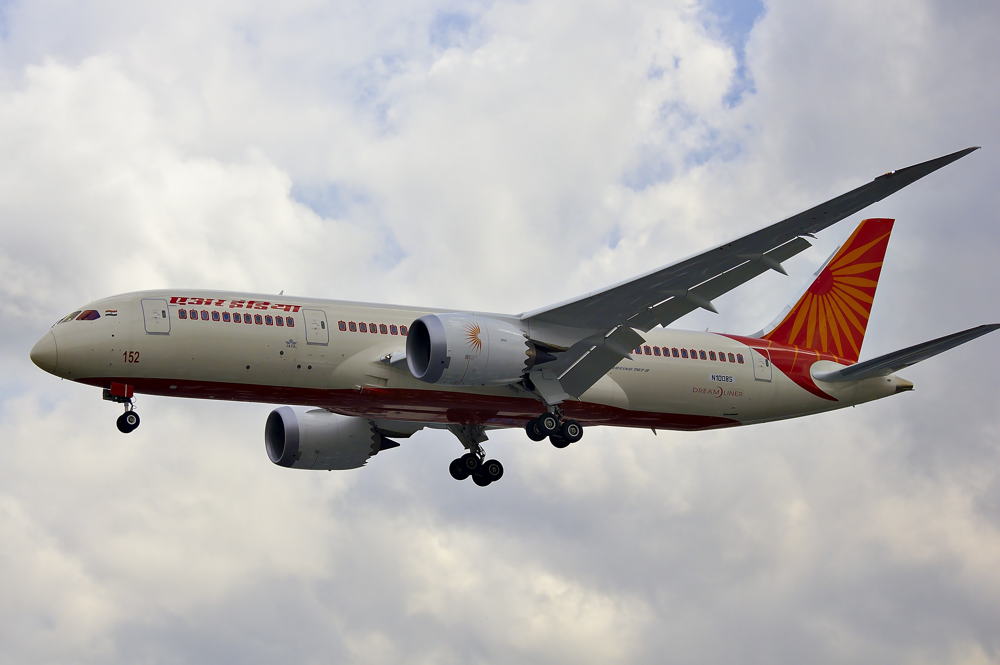

In [47]:
img1



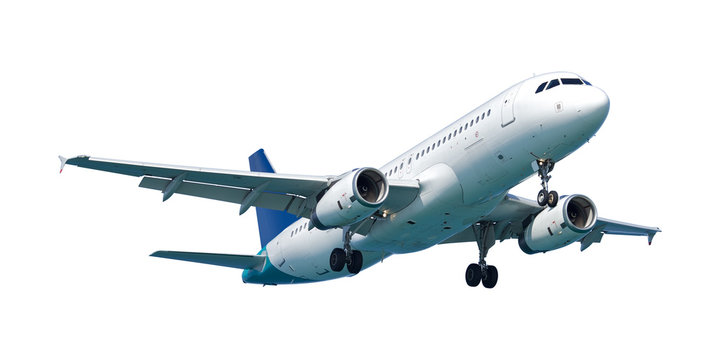

In [48]:
img3

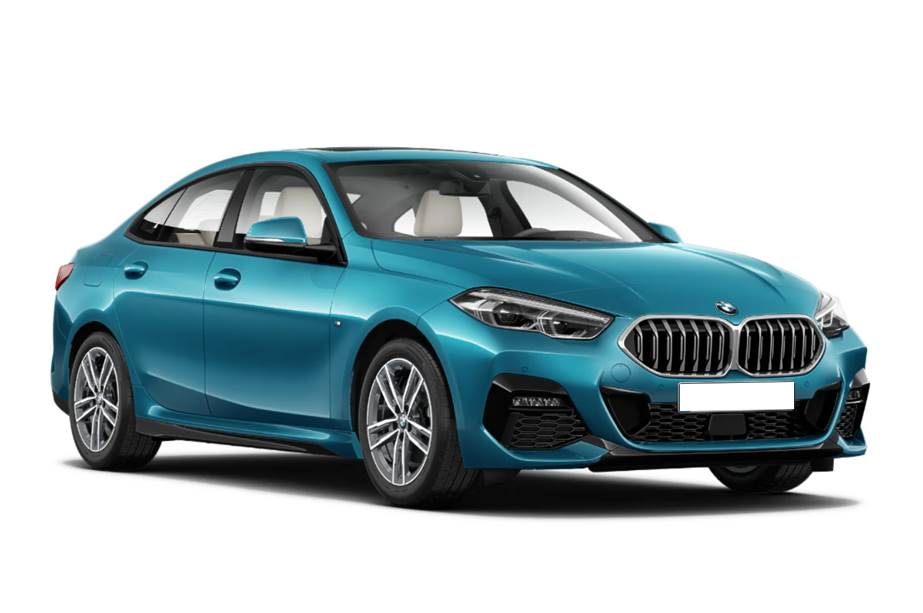

In [49]:
i=img_to_array(img2)
img2


In [50]:
i.shape
i=Image.fromarray(i.astype('uint8'))
i=i.resize((224,224))
i=img_to_array(i)

In [51]:
i=i.reshape(1,224,224,3)

In [52]:
i

array([[[[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        ...,

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.]],

        [[255., 255., 255.],
       

In [53]:
model.predict(i)

1/1 [==============================] - 0s 237ms/step


array([[0.]], dtype=float32)